# Trajectory Analysis

## PAGA

Partition-based graph abstraction (PAGA), is an algorithm which provides an interpretable graph-like map of the arising data manifold, based on estimating connectivity of manifold partitions.

Before running `PAGA`, we need to create a group of cluster results and a neigbobor pairwise matrix. Here we use mouse embryo data for demo. Download the **[example data](http://116.6.21.110:8090/share/dd965cba-7c1f-40b2-a275-0150890e005f)** first.

In [2]:
import stereo as st
import warnings
warnings.filterwarnings('ignore')

# read data
data = st.io.read_h5ad('./Demo_Embryo/Embyro_E16.5.h5ad')

# preprocessing
data.tl.cal_qc()
data.tl.normalize_total(target_sum=1e4)
data.tl.log1p()

# hvg
data.tl.highly_variable_genes(min_mean=0.0125, max_mean=3, min_disp=0.5, res_key='highly_variable_genes', n_top_genes=None)

data.tl.scale(zero_center=False)

# embedding
data.tl.pca(use_highly_genes=True, hvg_res_key='highly_variable_genes', n_pcs=20, res_key='pca', svd_solver='arpack')
data.tl.neighbors(pca_res_key='pca', n_pcs=30, res_key='neighbors', n_jobs=8)

[2023-07-11 10:54:41][Stereo][14228][MainThread][2512][st_pipeline][37][INFO]: start to run cal_qc...
[2023-07-11 10:54:43][Stereo][14228][MainThread][2512][st_pipeline][40][INFO]: cal_qc end, consume time 1.4020s.
[2023-07-11 10:54:43][Stereo][14228][MainThread][2512][st_pipeline][37][INFO]: start to run normalize_total...
[2023-07-11 10:54:44][Stereo][14228][MainThread][2512][st_pipeline][40][INFO]: normalize_total end, consume time 1.5481s.
[2023-07-11 10:54:44][Stereo][14228][MainThread][2512][st_pipeline][37][INFO]: start to run log1p...
[2023-07-11 10:54:46][Stereo][14228][MainThread][2512][st_pipeline][40][INFO]: log1p end, consume time 1.9720s.
[2023-07-11 10:54:46][Stereo][14228][MainThread][2512][st_pipeline][37][INFO]: start to run highly_variable_genes...
[2023-07-11 10:54:49][Stereo][14228][MainThread][2512][st_pipeline][40][INFO]: highly_variable_genes end, consume time 2.6860s.
[2023-07-11 10:54:49][Stereo][14228][MainThread][2512][st_pipeline][37][INFO]: start to run sc

In [4]:
data.tl.paga(groups='annotation', neighbors_key='neighbors')

[2023-07-11 10:56:08][Stereo][14228][MainThread][2512][st_pipeline][71][INFO]: register algorithm paga to <stereo.core.st_pipeline.AnnBasedStPipeline object at 0x00000191E0666DF0>


We could obtain `connectivities` and `connectivities_tree` in the PAGA result.`connectivities_tree` indicates cluster-to-cluster relation.

In [5]:
data.tl.result['paga']

{'connectivities': <25x25 sparse matrix of type '<class 'numpy.float64'>'
 	with 358 stored elements in Compressed Sparse Row format>,
 'connectivities_tree': <25x25 sparse matrix of type '<class 'numpy.float64'>'
 	with 24 stored elements in Compressed Sparse Row format>,
 'annotation_sizes': array([ 3822,   194,  3400, 17374,  5602,  5850, 11287,  1727,  8803,
         2047,  6304,  1227,  3723,   457,  2396,  2158, 14167,  3760,
         6656,  3465,  9853,   383,  4471,  2007,   634]),
 'groups': 'annotation'}

## Cluster Trajectory

Plot the cluster trajectory describing by the result of PAGA.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

<Figure size 6400x4800 with 0 Axes>

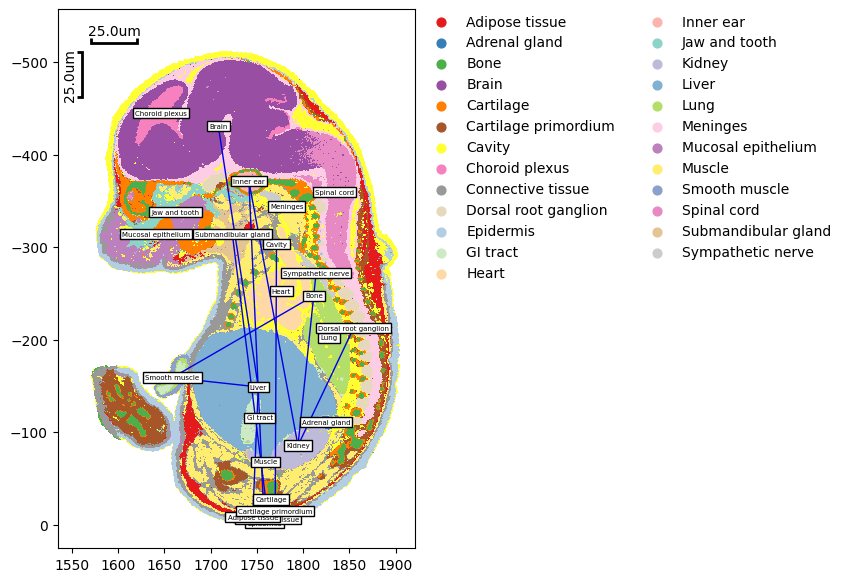

In [7]:
x_raw = data.position[:, 0]
y_raw = data.position[:, 1]

data.plt.plot_cluster_traj(
        data.tl.result['paga']['connectivities_tree'].todense(), 
        x_raw,
        y_raw,
        data.cells['annotation'].to_numpy(), 
        lower_thresh_not_equal=0.95, 
        count_thresh=100, 
        eps_co=30, 
        check_surr_co=20,
        show_ticks=True,
        type_traj="straight",
        plotting_scale_width=50,
        )

## DPT

The chronology of differentiated cells is essentially implicit in their single-cell expression products. Diffusion pseudotime (DPT) is an efficient way to estimate this order, which uses diffusion-like random walks to measure cell-to-cell metastasis. Our DPT method enables the reconstruction of cellular development, identifying transient or metastable states, branching decisions, and differentiation endpoints.

As an example, we choose the first 100 leiden-1 cells as root cells.

In [8]:
import numpy as np

# setting the `iroot` to data.tl.result
data.tl.result['iroot'] = np.flatnonzero(data.cells['annotation'] == 'Heart')[100]
data.tl.dpt(n_branchings=0)

[2023-07-11 10:57:12][Stereo][14228][MainThread][2512][st_pipeline][71][INFO]: register algorithm dpt to <stereo.core.st_pipeline.AnnBasedStPipeline object at 0x00000191E0666DF0>
[2023-07-11 10:57:12][Stereo][14228][MainThread][2512][main][1026][WARNING]: Trying to run `tl.dpt` without prior call of `tl.diffmap`. Falling back to `tl.diffmap` with default parameters.
[2023-07-11 10:57:12][Stereo][14228][MainThread][2512][main][15][INFO]: computing Diffusion Maps using n_comps=15(=n_dcs)
[2023-07-11 10:57:12][Stereo][14228][MainThread][2512][struct][717][INFO]: computing transitions
[2023-07-11 10:57:12][Stereo][14228][MainThread][2512][struct][740][INFO]:     finished
[2023-07-11 10:57:20][Stereo][14228][MainThread][2512][struct][802][INFO]:     eigenvalues of transition matrix
    [1.         0.9995111  0.9992852  0.99891824 0.99856955 0.9984492
     0.9983294  0.99828434 0.9979816  0.9975363  0.9973896  0.9962418
     0.99529386 0.9949422  0.9944956 ]
[2023-07-11 10:57:20][Stereo][142

## Vector Plot 

The stream-mode(setting parameter `type` as `stream`) vector plot firstly we showing, is a plot who describes the steam that one cluster flows to the other, displaying the cluster-clusetr's interactive direction.

[2023-07-11 10:57:38][Stereo][14228][MainThread][2512][plot_collection][59][INFO]: register plot_func plot_vec to <stereo.plots.plot_collection.PlotCollection object at 0x00000191DD2A04C0>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

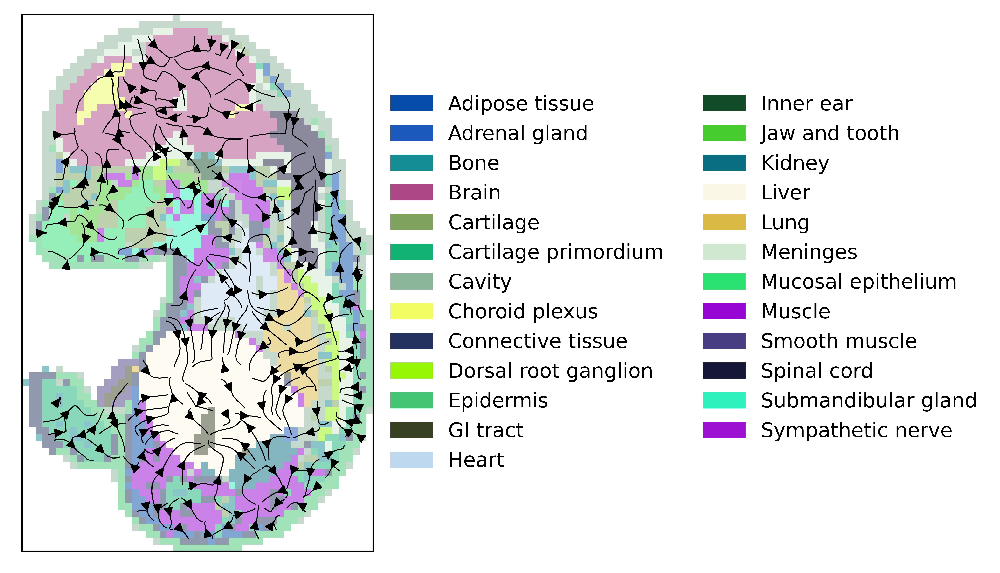

In [9]:
data.plt.plot_vec(
        data.position[:, 0],
        data.position[:, 1],
        data.cells['annotation'].to_numpy(),
        data.tl.result['dpt_pseudotime'],
        type='stream',
        line_width=0.5,
        background='field',
        num_pix=50,
        filter_type='gauss',
        sigma_val=1,
        radius_val=3,
        scatter_s=0.1,
        density=2,
        seed_val=0,
        num_legend_per_col=20,
        dpi_val=1000
        )

We could also use the result to complete vec-mode plot.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

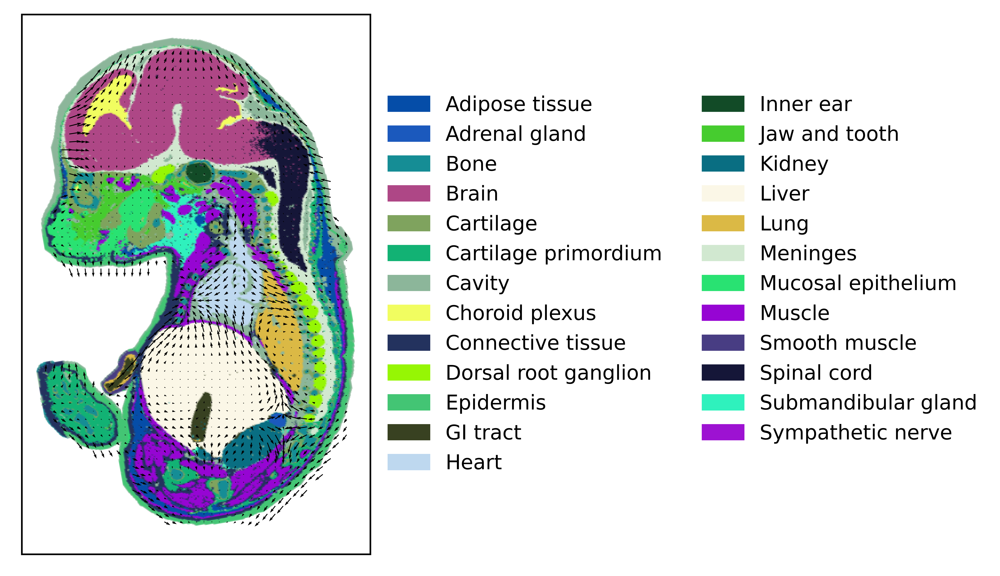

In [10]:
data.plt.plot_vec(
        data.position[:, 0],
        data.position[:, 1],
        data.cells['annotation'].to_numpy(),
        data.tl.result['dpt_pseudotime'],
        type='vec',
        background='scatter',
        num_pix=40,
        filter_type='gauss',
        sigma_val=2,
        radius_val=1,
        scatter_s=2,
        density=2,
        seed_val=0,
        dpi_val=1000
        )

[2023-07-11 10:58:05][Stereo][14228][MainThread][2512][plot_collection][59][INFO]: register plot_func plot_time_scatter to <stereo.plots.plot_collection.PlotCollection object at 0x00000191DD2A04C0>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

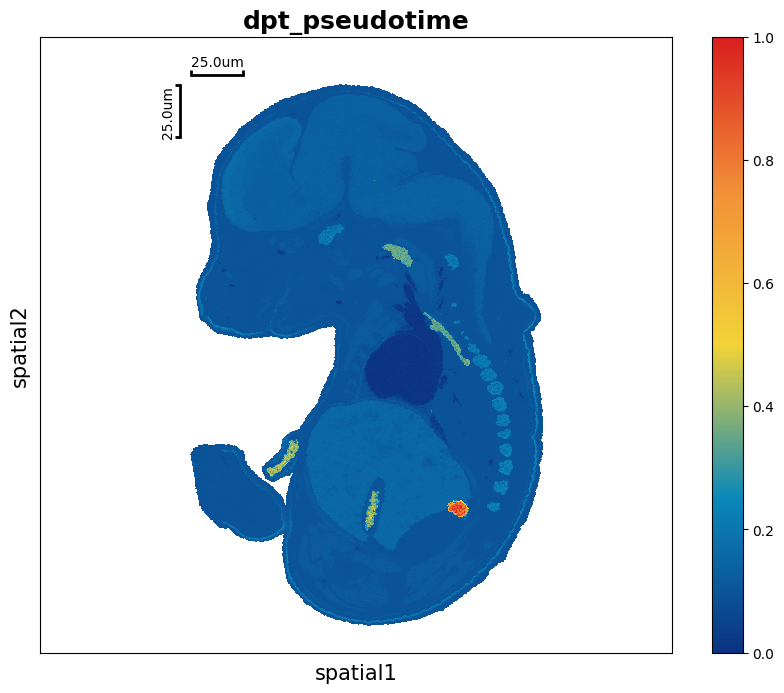

In [11]:
data.plt.plot_time_scatter(group='annotation', plotting_scale_width=50)

# Time Series Analysis

Using `PAGA` method to find out time seires samples' developmental trajectory.
Download demo data [Mouse Forebrain](https://pan.genomics.cn/ucdisk/api/2.0/share/link/download?shareEventId=share_2022928142945896_010df2aa7d344d97a610557de7bad81b&nodeId=8a8080438842c12f0188522965a23618&code=).

In [12]:
# read data
data = st.io.read_h5ad('./Demo_Embryo/mouse_forebrain.anndata080.h5ad')

# preprocessing
data.tl.normalize_total()
data.tl.log1p()

# embedding
data.tl.pca(svd_solver='arpack', n_pcs=20)
data.tl.neighbors(n_neighbors=15, n_jobs=2, pca_res_key='pca')

# paga
data.tl.paga(groups='class')

# time-series
data.tl.time_series_analysis(
                run_method='tvg_marker', 
                use_col='timepoint',                      
                branch=['E9.5', 'E10.5', 'E11.5', 'E12.5', 'E13.5', 'E14.5', 'E15.5', 'E16.5'],                 
                p_val_combination='FDR'
                )

[2023-07-11 11:04:36][Stereo][14228][MainThread][2512][st_pipeline][37][INFO]: start to run normalize_total...
[2023-07-11 11:04:36][Stereo][14228][MainThread][2512][st_pipeline][40][INFO]: normalize_total end, consume time 0.2240s.
[2023-07-11 11:04:36][Stereo][14228][MainThread][2512][st_pipeline][37][INFO]: start to run log1p...
[2023-07-11 11:04:36][Stereo][14228][MainThread][2512][st_pipeline][40][INFO]: log1p end, consume time 0.2950s.
[2023-07-11 11:04:36][Stereo][14228][MainThread][2512][st_pipeline][37][INFO]: start to run pca...
[2023-07-11 11:04:45][Stereo][14228][MainThread][2512][st_pipeline][40][INFO]: pca end, consume time 9.0561s.
[2023-07-11 11:04:45][Stereo][14228][MainThread][2512][st_pipeline][37][INFO]: start to run neighbors...
[2023-07-11 11:04:46][Stereo][14228][MainThread][2512][st_pipeline][40][INFO]: neighbors end, consume time 0.9470s.
[2023-07-11 11:04:46][Stereo][14228][MainThread][2512][st_pipeline][71][INFO]: register algorithm paga to <stereo.core.st_pi

[2023-07-11 11:05:44][Stereo][14228][MainThread][2512][plot_collection][59][INFO]: register plot_func boxplot_transit_gene to <stereo.plots.plot_collection.PlotCollection object at 0x00000192211F61F0>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

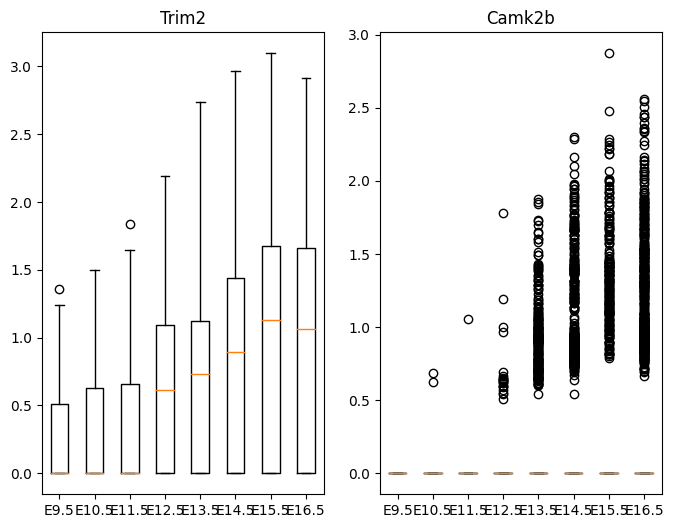

In [13]:
data.plt.boxplot_transit_gene(
                    data, 
                    use_col='timepoint',
                    branch=['E9.5', 'E10.5', 'E11.5', 'E12.5', 'E13.5', 'E14.5', 'E15.5', 'E16.5'],
                    genes=['Trim2', 'Camk2b']
                    )

[2023-07-11 11:06:31][Stereo][14228][MainThread][2512][plot_collection][59][INFO]: register plot_func paga_time_series_plot to <stereo.plots.plot_collection.PlotCollection object at 0x00000192211F61F0>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

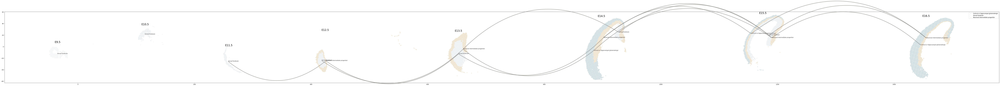

In [14]:
data.plt.paga_time_series_plot(
                data, 
                use_col='class', 
                batch_col='timepoint', 
                fig_height=10
                )

In [15]:
data.tl.time_series_analysis(run_method='other')

epoch 100 : time cosumed2.2130s, loss:0.0006780666304807004
epoch 200 : time cosumed2.2069s, loss:0.0001849436050880282
epoch 300 : time cosumed2.1706s, loss:8.646421691757555e-05
epoch 400 : time cosumed2.2431s, loss:4.671692929700266e-05
epoch 500 : time cosumed2.4709s, loss:2.644195850537434e-05
epoch 600 : time cosumed2.1990s, loss:1.5211865667164037e-05
epoch 700 : time cosumed2.6490s, loss:8.804390869060486e-06
epoch 800 : time cosumed2.9783s, loss:5.108039130563569e-06
epoch 900 : time cosumed2.6667s, loss:2.966528299591653e-06
epoch 1000 : time cosumed2.2030s, loss:1.7236256020514151e-06
epoch 1100 : time cosumed2.1931s, loss:1.001694032193301e-06
epoch 1200 : time cosumed2.0477s, loss:5.822074245487308e-07
epoch 1300 : time cosumed2.1581s, loss:3.384134552031348e-07
epoch 1400 : time cosumed2.1740s, loss:1.9671279855026924e-07
epoch 1500 : time cosumed2.1090s, loss:1.1434736238435939e-07


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

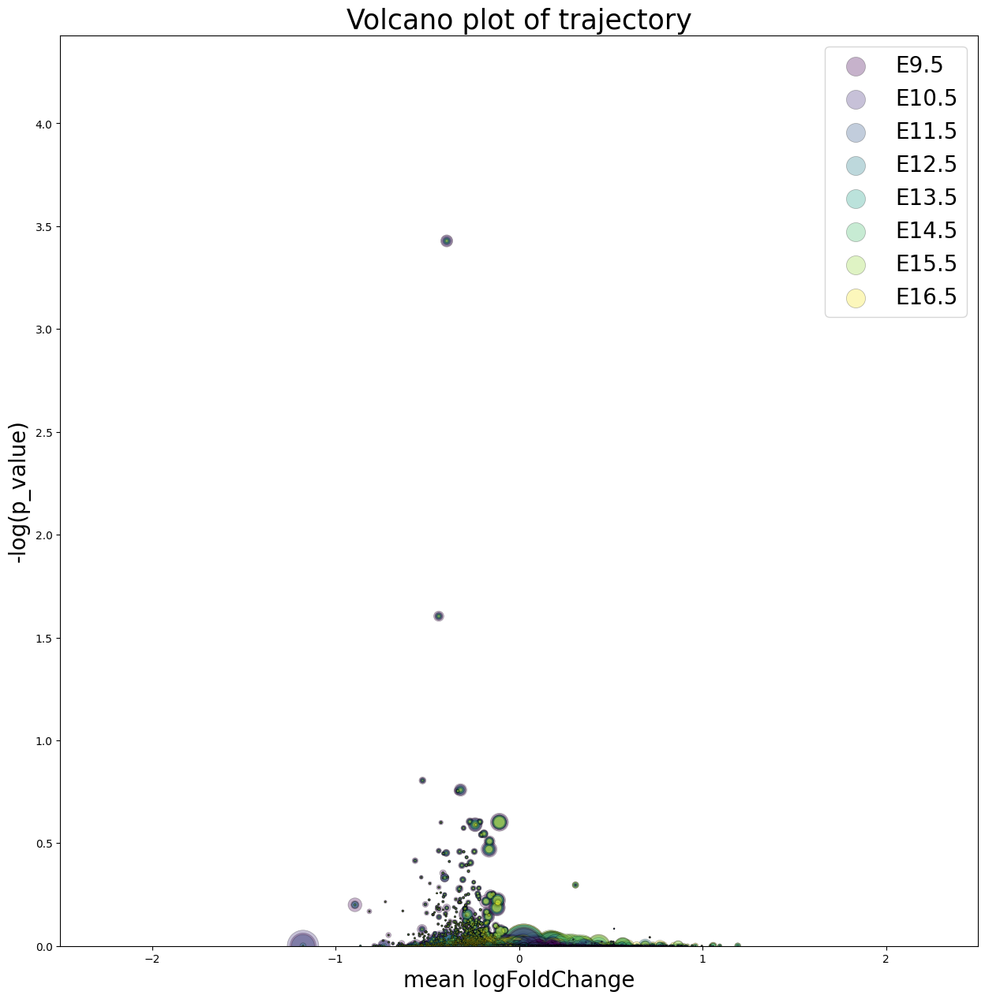

In [17]:
data.plt.TVG_volcano_plot(data, use_col='timepoint', branch=['E9.5', 'E10.5', 'E11.5', 'E12.5', 'E13.5', 'E14.5', 'E15.5', 'E16.5'])